<a href="https://colab.research.google.com/github/rlskoeser/shxco-missingdata-specreading/blob/main/missing-data/Sco_prophet_missingdata_weekly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Weekly Missing Data from Shakespeare and Company Project 

## Setup Libraries and Load S&Co Data



In [1]:
try:
    import prophet
    print("Prophet is already installed.")
except ImportError:
    print("Prophet is not installed. Installing...")
    import subprocess
    subprocess.check_call(["pip", "install", "prophet"])

Prophet is already installed.


In [19]:
from datetimerange import DateTimeRange
import warnings
warnings.filterwarnings('ignore')
import altair as alt
alt.data_transformers.disable_max_rows()


import sys
sys.path.append('../../')

from scripts.missing_data_processing import *
from scripts.forecasting_missing_data import *

In [20]:
events_df = load_initial_data()
logbook_events_df = generate_logbooks_events(events_df)
membership_events = generate_member_events(events_df)
logbook_gaps_df, logbooks_weekly_count, logbook_gaps = generate_logbook_gaps(logbook_events_df)
member_events, newmember_yearly_count = generate_member_events(events_df)
members_first_events = member_events.groupby("member_id").first().reset_index()
newmember_subscriptions_by_year, newmember_subscriptions_by_week = generate_newmember_subscriptions(member_events, logbook_gaps)
subscription_first_events = member_events[member_events.source_type.str.contains('Logbook') & member_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_id").first().reset_index()

The 6 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)

The 5 small gaps in the logbooks that will be skipped
	October 30 1927 to November 01 1927 (2 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)
	August 29 1939 to September 12 1939 (14 days)


### use prophet to forecast missing subscriptions

In [4]:
post1932_date = pd.to_datetime(date(1932, 9, 27))
# Assuming `weekly_subscriptions` and `logbook_gaps` are defined elsewhere
forecasted_subscriptions = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date)

14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing
14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing
14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing
14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing
14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing
14:58:17 - cmdstanpy - INFO - Chain [1] start processing
14:58:17 - cmdstanpy - INFO - Chain [1] done processing


#### plot the forecasts

In [5]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=False, separate_model_decades=False)


alt.LayerChart(...)

In [6]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

In [7]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=True, separate_model_decades=True)

alt.LayerChart(...)

### what if we fit prophet on all weeks?

In [8]:
prophet_model, all_newsub_weekly_forecasts_dfs = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=True)

14:59:20 - cmdstanpy - INFO - Chain [1] start processing
14:59:20 - cmdstanpy - INFO - Chain [1] done processing
14:59:20 - cmdstanpy - INFO - Chain [1] start processing
14:59:20 - cmdstanpy - INFO - Chain [1] done processing
14:59:21 - cmdstanpy - INFO - Chain [1] start processing
14:59:21 - cmdstanpy - INFO - Chain [1] done processing
14:59:21 - cmdstanpy - INFO - Chain [1] start processing
14:59:21 - cmdstanpy - INFO - Chain [1] done processing
14:59:21 - cmdstanpy - INFO - Chain [1] start processing
14:59:21 - cmdstanpy - INFO - Chain [1] done processing
14:59:22 - cmdstanpy - INFO - Chain [1] start processing
14:59:22 - cmdstanpy - INFO - Chain [1] done processing
14:59:22 - cmdstanpy - INFO - Chain [1] start processing
14:59:22 - cmdstanpy - INFO - Chain [1] done processing


In [9]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(all_newsub_weekly_forecasts_dfs, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

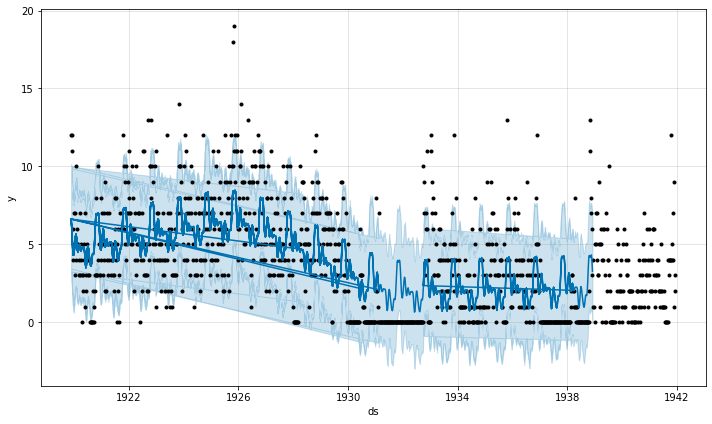

In [10]:
fig1 = prophet_model.plot(all_newsub_weekly_forecasts_dfs)

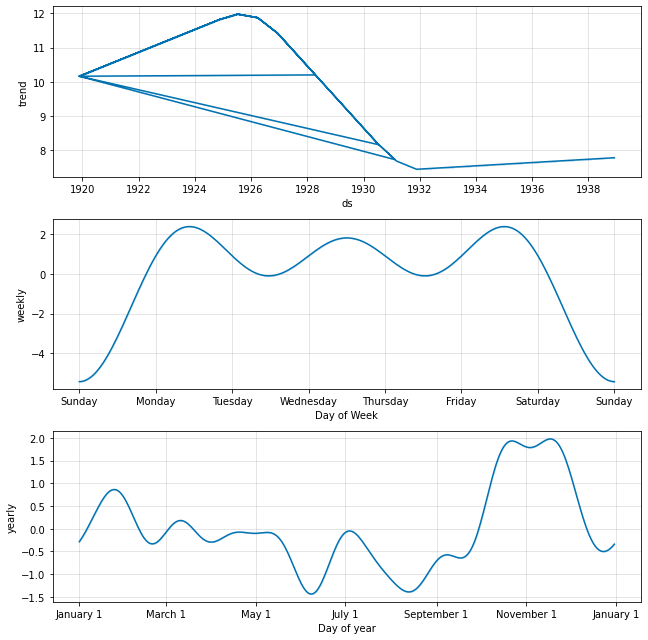

In [11]:
fig2 = prophet_model.plot_components(all_newsub_weekly_forecasts_dfs)

In [12]:
newsubs_base = alt.Chart(newmember_subscriptions_by_week).encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_line = newsubs_base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='new subscriptions per week'))
)

# draw rectangles to highlight logbook gaps
logbook_gaps_span = alt.Chart(logbook_gaps_df).encode(
     alt.X('start')
).properties(
    width=1200,
    height=275
).mark_rect(
    opacity=0.2, color="gray"
).encode(
    x='start',
    x2='end',
    y=alt.value(0),  # 0 pixels from bottom
    y2=alt.value(275)  # 300 pixels from top
)

newsubs_forecast_base = alt.Chart(forecasted_subscriptions).encode(
    alt.X('ds:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_forecast_line = newsubs_forecast_base.mark_line(color="orange").encode(
    alt.Y('yhat',
          axis=alt.Axis(title='new subscriptions per week'), scale=alt.Scale(domain=[0, 20])),
)
# .transform_filter(
    # alt.FieldLTPredicate(field='ds', lt=date(1919, 1,1))
# )

newsubs_area = newsubs_forecast_base.mark_area(opacity=0.3, color='orange').encode(
    alt.Y('yhat_upper',
          axis=alt.Axis(title=None), scale=alt.Scale(domain=[0, 20])),
    alt.Y2('yhat_lower')
)

# add newsubs last so it will be layered on top
newsubs_line + logbook_gaps_span + newsubs_area + newsubs_forecast_line

alt.LayerChart(...)

### forecast again, with growth and cap

the default forecast behavior is following a downward trend in the existing data leading into our later gaps, but based on the data afterwards that doesn't look right. 




In [13]:
# when is the largest week? 
growth_cap = newmember_subscriptions_by_week.total.max()
newmember_subscriptions_by_week[newmember_subscriptions_by_week.total == growth_cap]

,date,total
311,1925-11-08,19


In [14]:
newsub_weekly_growth_forecasts = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=False, return_prophet_model=False, use_weekly_growth_cap=True)

14:59:43 - cmdstanpy - INFO - Chain [1] start processing


14:59:43 - cmdstanpy - INFO - Chain [1] done processing
14:59:43 - cmdstanpy - INFO - Chain [1] start processing
14:59:43 - cmdstanpy - INFO - Chain [1] done processing
14:59:44 - cmdstanpy - INFO - Chain [1] start processing
14:59:44 - cmdstanpy - INFO - Chain [1] done processing
14:59:44 - cmdstanpy - INFO - Chain [1] start processing
14:59:44 - cmdstanpy - INFO - Chain [1] done processing
14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:45 - cmdstanpy - INFO - Chain [1] done processing
14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:45 - cmdstanpy - INFO - Chain [1] done processing


In [15]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=False, separate_model_decades=False)

alt.LayerChart(...)

In [16]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### fit on all weeks, logistic growth

In [17]:
lognewsub_weeks_fcst = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=False, use_weekly_growth_cap=True, use_total_growth_cap=True)

15:00:00 - cmdstanpy - INFO - Chain [1] start processing
15:00:00 - cmdstanpy - INFO - Chain [1] done processing
15:00:00 - cmdstanpy - INFO - Chain [1] start processing
15:00:00 - cmdstanpy - INFO - Chain [1] done processing
15:00:00 - cmdstanpy - INFO - Chain [1] start processing
15:00:00 - cmdstanpy - INFO - Chain [1] done processing
15:00:00 - cmdstanpy - INFO - Chain [1] start processing
15:00:01 - cmdstanpy - INFO - Chain [1] done processing
15:00:01 - cmdstanpy - INFO - Chain [1] start processing
15:00:01 - cmdstanpy - INFO - Chain [1] done processing
15:00:01 - cmdstanpy - INFO - Chain [1] start processing
15:00:01 - cmdstanpy - INFO - Chain [1] done processing
15:00:02 - cmdstanpy - INFO - Chain [1] start processing
15:00:02 - cmdstanpy - INFO - Chain [1] done processing


In [18]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, newmember_subscriptions_by_week, include_line=False)
plot_newsubs_weekly_forecast(lognewsub_weeks_fcst, gap_areas, logbook_gaps, chart_height, post1932_date, newmember_subscriptions_by_week, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### aggregate forecast values

In [21]:



onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)
oneweek = timedelta(days=7)

# newsub_member_total = len(subscription_first_events.member_id.unique())
# member_total = len(events_df.member_id.unique())

# allow overrides for aggregrating uniq name estimates
def aggregrate_missing_newsub_estimates(forecast_df, newmember_subscriptions_by_week=newmember_subscriptions_by_week, newsub_member_total=None, member_total=None):

  newsub_weekly_missing = 0
  newsub_weekly_missing_upper = 0
  newsub_weekly_missing_lower = 0

  if newsub_member_total is None:
    newsub_member_total = len(subscription_first_events.member_id.unique())
  if member_total is None:
    member_total = len(events_df.member_id.unique())


  newsub_weekly_estimates = []

  for i, gap in enumerate(logbook_gaps): 
    gap_start = gap['start']
    gap_end = gap['end']
    # print(gap_start, gap_end)
    # print('gap range ')
    gap_range = DateTimeRange(gap_start, gap_end)
    # print(gap_range)

    # get documented counts for this time period
    gap_counts = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date >= gap_start) & (newmember_subscriptions_by_week.date <= gap_end + oneweek)]
    # now get the forecast for the same weeks
    
    # weekly_forecast = newsub_weekly_forecasts_df[(newsub_weekly_forecasts_df.ds >= gap_start) & (newsub_weekly_forecasts_df.ds <= gap_end + oneweek)]

    weekly_forecast = forecast_df[(forecast_df.ds >= gap_start) & (forecast_df.ds <= gap_end + oneweek)]
    # print(weekly_forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

    for week in gap_counts.itertuples():
      week_start = week.date 

      # do logbook weeks and forecast weeks match?
      # missing estimate is the forecast value minus any actual recorded count for this day
      documented_week = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date == week.date]  #.iloc[0]
      # seems possible there's no documented week
      if documented_week.shape[0]:
        documented_week = documented_week.iloc[0]
      else: 
        documented_week = None

      # check if the padding put us past the end of the current gap
      if week_start > gap_end:
        continue

      # get the end of the same month (first of the next month minus one day)
      week_end = week_start + oneweek
      # how many days from this month overlap with our gap?
      gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
      overlap_days = gap_intersection.timedelta.days
      if overlap_days != 7:
        print('gap overlap for %s is %d days' % (week_end, overlap_days))
      # what is our threshold for using the forecast value instead of recorded? 
      # let's try 3 days
      if overlap_days > 3:
        week_total = 0
        if not documented_week.empty:
          week_total = week.total

        # get the forecast value for this week
        week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
        # missing estimate is the forecast value minus any actual recorded count for this month
        newsub_weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
        newsub_weekly_missing_upper += (week_forecast.yhat_upper - week_total)
        # cap lower estimate at zero
        newsub_weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

        # aggregate forecast values so we can output as csv for reference
        newsub_weekly_estimates.append({
            'date': week.date,
            'documented_total': week_total,
            'gap_days': overlap_days,
            'forecast': week_forecast.yhat,
            'forecast_upper': week_forecast.yhat_upper,
            'forecast_lower': week_forecast.yhat_lower,
            'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
        })

        newsub_estimates_df = pd.DataFrame(newsub_weekly_estimates)
        # newsub_estimates_df.to_csv('newsub_weekly_forecast.csv', index=False)

  print('''\n\nmissing estimates:
    %s
    upper: %s
    lower: %s''' % (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower))
  
  estimated_total = newsub_member_total + newsub_weekly_missing
  estimated_total_upper = newsub_member_total + newsub_weekly_missing_upper
  estimated_total_lower = newsub_member_total + newsub_weekly_missing_lower

  est_percent = (member_total / estimated_total ) * 100
  est_percent_upper = (member_total / estimated_total_upper ) * 100
  est_percent_lower = (member_total / estimated_total_lower ) * 100

  # summarize the result
  print('''
  total unique members: %d
  total members from first subscriptions: %d
  estimated missing subscriptions: %.2f (upper %.2f, lower %.2f)
  estimated total subscriptions from logbooks: %.2f (upper %.2f, lower %.2f)
  total missing: %d (upper %d, lower %d)
  estimated percent: %.2f (upper %.2f, lower %.2f)
  ''' % (member_total, newsub_member_total, 
         # estimated missing
          newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower,
         # estimated total
          estimated_total, estimated_total_upper, estimated_total_lower, 
         # total missing
          max(0, estimated_total - member_total),
            estimated_total_upper - member_total,
          max(0, estimated_total_lower - member_total),
          est_percent, est_percent_upper, est_percent_lower
          ))
  
  # return (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower)
  
# newsub_missing, newsub_missing_upper, newsub_missing_lower = aggregrate_missing_newsub_estimates()

### summarize

In [22]:
# initial forecast, calculated the same way as membership activity
aggregrate_missing_newsub_estimates(forecasted_subscriptions)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    457.87281808915867
    upper: 1129.8560938409792
    lower: 95.47691781307819

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 457.87 (upper 1129.86, lower 95.48)
  estimated total subscriptions from logbooks: 4777.87 (upper 5449.86, lower 4415.48)
  total missing: 0 (upper 310, lower 0)
  estimated percent: 107.56 (upper 94.30, lower 116.39)
  


In [23]:
# second forecast, fitting prophet on all data 
# - this result seems better than the first linear model
aggregrate_missing_newsub_estimates(all_newsub_weekly_forecasts_dfs)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    494.31937615945714
    upper: 1220.6856961201408
    lower: 32.30296358529769

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 494.32 (upper 1220.69, lower 32.30)
  estimated total subscriptions from logbooks: 4814.32 (upper 5540.69, lower 4352.30)
  total missing: 0 (upper 401, lower 0)
  estimated percent: 106.74 (upper 92.75, lower 118.08)
  


In [24]:
# third forecast, with logistic growth and cap
aggregrate_missing_newsub_estimates(newsub_weekly_growth_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    711.7022603722537
    upper: 1458.4669265457292
    lower: 152.2168587189032

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 711.70 (upper 1458.47, lower 152.22)
  estimated total subscriptions from logbooks: 5031.70 (upper 5778.47, lower 4472.22)
  total missing: 0 (upper 639, lower 0)
  estimated percent: 102.13 (upper 88.93, lower 114.91)
  
